In [1]:
import pandas as pd
dat= pd.read_csv('head_base_mapping.csv')
dat.shape[0]
dat.head()

,Unnamed: 0,dir_loc,head_name,original_image
0,0,D:/object_detection/tf_model_dir/models/resear...,00a132f16df6f4e94a5d1ddf05ac2d8b_0.jpg,00a132f16df6f4e94a5d1ddf05ac2d8b.jpg
1,1,D:/object_detection/tf_model_dir/models/resear...,014 Atalante 2_0.png,014 Atalante 2.png
2,2,D:/object_detection/tf_model_dir/models/resear...,0144_0.jpg,0144.jpg
3,3,D:/object_detection/tf_model_dir/models/resear...,017 Cu Chulainn 4_0.png,017 Cu Chulainn 4.png
4,4,D:/object_detection/tf_model_dir/models/resear...,0291b4c9bde1530c3c8fac7d01c08d9a_0.jpg,0291b4c9bde1530c3c8fac7d01c08d9a.jpg


In [53]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
from torch.autograd import Variable
import PIL
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread
%matplotlib inline
from annoy import AnnoyIndex


imsize=224
### resnet stuff
extractor_resnet = models.resnet101(pretrained=True)
extractor_resnet.eval()
num_ftrs = 512

loader = transforms.Compose([transforms.Resize((imsize,imsize)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

class ResNet34Bottom(nn.Module):
    def __init__(self, original_model):
        super(ResNet34Bottom, self).__init__()
        self.features = nn.Sequential(*list(original_model.children())[:-1])
        
    def forward(self, x):
        x = self.features(x)
        return x

res34_model = models.resnet34(pretrained=True)
res34_model.eval()
res34_conv2 = ResNet34Bottom(res34_model)

def image_loader(image_name):
    """load image, returns cuda tensor"""
    #image_loader_1 = PIL.Image.fromarray(image_name)
    image_loader_1 = PIL.Image.open(image_name).convert("RGB")
    image_loader_1 = loader(image_loader_1).float()
    image_loader_1 = Variable(image_loader_1, requires_grad=True)
    image_loader_1 = image_loader_1.unsqueeze(0)  #this is for VGG, may not be needed for ResNet
    y_pred = res34_conv2(image_loader_1)
    return list(y_pred.view(-1).detach().numpy())#.tolist()[0]#.cuda()  #assumes that you're using GPU

def showImagesHorizontally(annoy_dict, base_img, dir_, list_of_files,index):
    fig = figure(figsize=(160,90))
    number_of_files = len(list_of_files)
    list_of_files = [base_img] + list_of_files
    first_bool = 0 
    for i in range(number_of_files):
        if first_bool ==0:
            a=fig.add_subplot(1,number_of_files,i+1)
            image = imread(list_of_files[i])
            first_bool = 1
            
        else:
            a=fig.add_subplot(1,number_of_files,i+1)
            image = imread(dir_+annoy_dict[str(list_of_files[i])])
        
        imshow(image,aspect='equal')
        axis('off')
    #fig.savefig('D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/examples/{}.png'.format(index))
    #fig.clf()
    

In [54]:
head_dir = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/heads/'
full_dir = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/all_images/'


In [55]:
#head_dir = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/crop_holder/'
#head_name = '331453-Fate_Series-Saber_Lily-748x1008_0.png'
#feature_vec = image_loader(head_dir+head_name)


In [56]:
#len(feature_vec)

In [57]:
print('manhattan')
annoy_index = AnnoyIndex(num_ftrs*2,metric='manhattan')

annoy_list = []
for index,row in dat.iterrows():
    img_dir = str(row['dir_loc'])
    img_name = str(row['head_name'])
    original_name = str(row['original_image'])
    
    feature_vec = image_loader(head_dir+img_name)
    feature_vec_full = image_loader(full_dir+original_name)
    
    final_vec = feature_vec+feature_vec_full
    
    annoy_index.add_item(index, final_vec)
    annoy_list.append(index)



manhattan


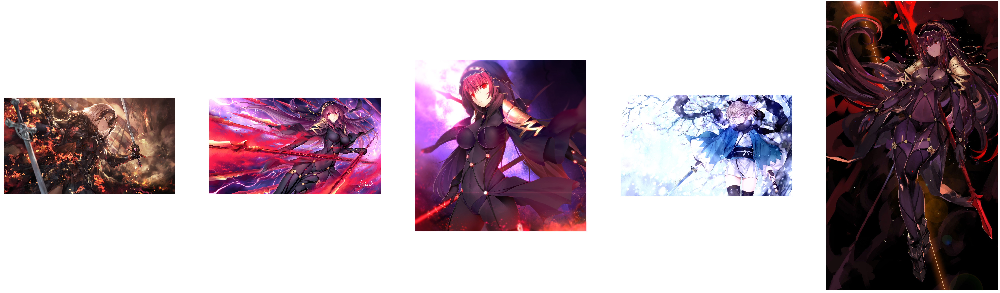

In [65]:
dat['annoy_index'] =annoy_list
annoy_index.build(200)
    #dat.head()
    #dat.to_csv('mapping_with_annoy.csv')
dict_fgo_annoy = {}
for index,row in dat.iterrows():
    dict_fgo_annoy[str(row['annoy_index'])] = str(row['original_image']) #switch this out


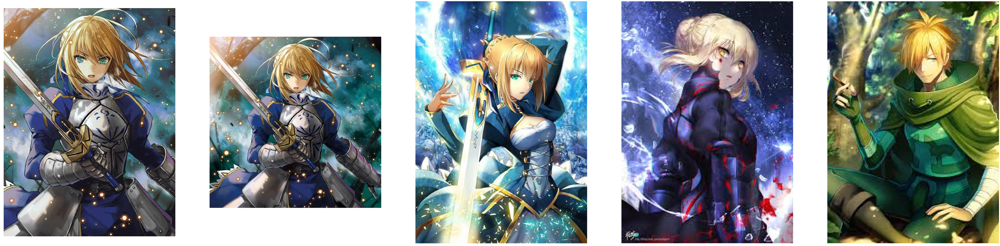

In [71]:

dir_ = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/'
head_dir = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/crop_holder/'
full_dir = 'F:/fgo_multi_label/test/'

head_name = 'saber1_0.jpg'
img_name = 'saber1.jpg'

feature_vec = image_loader(head_dir+head_name)
feature_vec_full = image_loader(full_dir+img_name)
final_vec = feature_vec+feature_vec_full
test_list = annoy_index.get_nns_by_vector(final_vec, 5)


dir_loc = 'D:/object_detection/tf_model_dir/models/research/object_detection/images_fgo_face/all_images/'



showImagesHorizontally(annoy_dict=dict_fgo_annoy, base_img=full_dir+img_name, dir_=dir_loc, list_of_files=test_list,index=1)

In [ ]:
annoy_index.save('annoy_euclidean_fgo_v3.ann')
